In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error as mape,mean_absolute_error as mae
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [10]:
def error(error1,error2,error3,error4):
    error = pd.DataFrame(columns=['MSE', 'RMSE', 'MAE', 'MAPE'])
    error = [{'MSE' : error1,'RMSE':error2,'MAE':error3,'MAPE':error4}]
    
    return error

# Train/Test Model

In [11]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,5)

X_train Shape : (14763, 5, 1)
y_train Shape : (14763, 1)
X_test Shape :  (293, 5, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [12]:
train

,cloud_cover
DateTime,
2021-11-16 11:15:00,0.990000
2021-11-16 11:16:00,0.989000
2021-11-16 11:17:00,0.987667
2021-11-16 11:18:00,0.987000
2021-11-16 11:19:00,0.987000
...,...
2021-12-15 16:55:00,0.321000
2021-12-15 16:56:00,0.304000
2021-12-15 16:57:00,0.286000


In [13]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [14]:
test1 = test.copy()

In [15]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 7ms/step - loss: 0.0076 - val_loss: 0.0041
Epoch 2/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0021 - val_loss: 0.0036
Epoch 3/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0019 - val_loss: 0.0032
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0017 - val_loss: 0.0028
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0015 - val_loss: 0.0023
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 7/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018

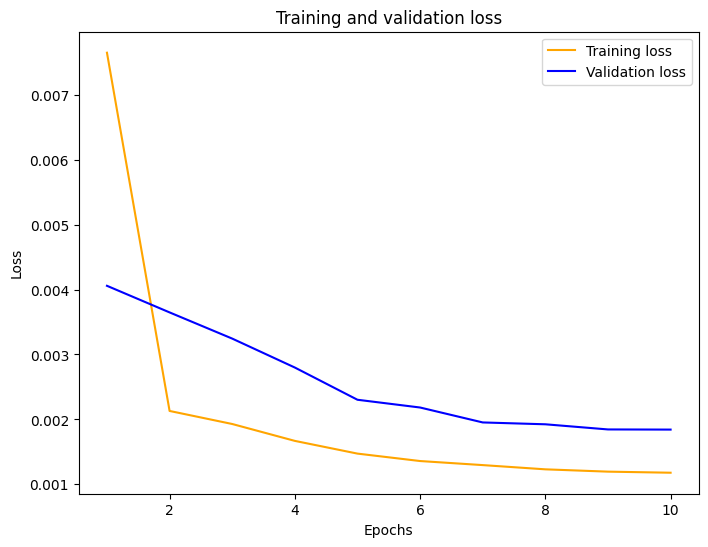

In [16]:
plot_curve(hist_adam)

In [17]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.330756
1,2021-12-16 09:11:00,0.112,0.148943
2,2021-12-16 09:12:00,0.116,0.118632
3,2021-12-16 09:13:00,0.112,0.118886
4,2021-12-16 09:14:00,0.099,0.116727
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.171209
289,2021-12-16 13:59:00,0.169,0.170886
290,2021-12-16 14:00:00,0.147,0.171631
291,2021-12-16 14:01:00,0.145,0.154430


In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [19]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_rmse_error = mean_squared_error(test1["cloud_cover"], test1["LSTM_adam"], squared=False)
lstm_mae_error = mae(test1["cloud_cover"], test1["LSTM_adam"])
lstm_mape_error = mape(test1['cloud_cover'], test1['LSTM_adam'])
error(lstm_mse_error_unit_50_adam,lstm_rmse_error,lstm_mae_error,lstm_mape_error)


[{'MSE': 0.0018342803574225254,
  'RMSE': 0.04282849935991834,
  'MAE': 0.011943099565676862,
  'MAPE': 0.057024183094116464}]

In [115]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'Frist layer', 'Drop out', 'Second layer', 'Drop out2', 'Third layer', 
                                 'Output layer', 'Epochs', 'MAE error', 'MAPE error','MSE error', 'RMSE error'])

data = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error, 'MAPE error' : lstm_mape_error,'MSE error':lstm_mse_error_unit_50_adam, 'RMSE error':lstm_rmse_error} ]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\2791275614.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [21]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 7ms/step - loss: 0.0052 - val_loss: 0.0035
Epoch 2/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0019 - val_loss: 0.0035
Epoch 3/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0016 - val_loss: 0.0021
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018

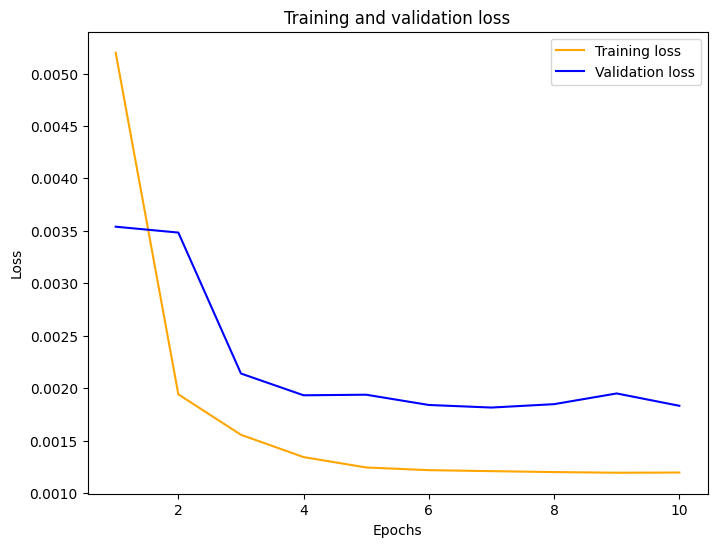

In [22]:
plot_curve(hist_50_rms)

In [23]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.330756,0.318283
1,2021-12-16 09:11:00,0.112,0.148943,0.120574
2,2021-12-16 09:12:00,0.116,0.118632,0.110354
3,2021-12-16 09:13:00,0.112,0.118886,0.114629
4,2021-12-16 09:14:00,0.099,0.116727,0.110894
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.171209,0.163314
289,2021-12-16 13:59:00,0.169,0.170886,0.163241
290,2021-12-16 14:00:00,0.147,0.171631,0.164158
291,2021-12-16 14:01:00,0.145,0.154430,0.144105


In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [25]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
lstm_rmse_error1 = mean_squared_error(test1["cloud_cover"], test1["LSTM_50_rms"], squared=False)
lstm_mae_error1 = mae(test1["cloud_cover"], test1["LSTM_50_rms"])
lstm_mape_error1 = mape(test1['cloud_cover'], test1['LSTM_50_rms'])
error(lstm_mse_error_unit_50_rms,lstm_rmse_error1,lstm_mae_error1,lstm_mape_error1)

[{'MSE': 0.0018220521198274056,
  'RMSE': 0.04268550245490154,
  'MAE': 0.014134296120637109,
  'MAPE': 0.06150459778426266}]

In [26]:
compare_model(lstm_mape_error,lstm_mape_error1)

Better MSE value is :  0.057024183094116464


,Model,MSE error
0,model,0.057024
1,model_1,0.061505


In [116]:
data1 = [{'Lags':5 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error1, 'MAPE error' : lstm_mape_error1,'MSE error':lstm_mse_error_unit_50_rms, 'RMSE error':lstm_rmse_error1}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\2392259794.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [28]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 7s 11ms/step - loss: 0.0241 - val_loss: 0.0051
Epoch 2/10
231/231 [==============================] - 1s 6ms/step - loss: 0.0028 - val_loss: 0.0049
Epoch 3/10
231/231 [==============================] - 1s 5ms/step - loss: 0.0026 - val_loss: 0.0047
Epoch 4/10
231/231 [==============================] - 1s 6ms/step - loss: 0.0025 - val_loss: 0.0045
Epoch 5/10
231/231 [==============================] - 1s 5ms/step - loss: 0.0024 - val_loss: 0.0042
Epoch 6/10
231/231 [==============================] - 1s 5ms/step - loss: 0.0022 - val_loss: 0.0039
Epoch 7/10
231/231 [==============================] - 1s 5ms/step - loss: 0.0021 - val_loss: 0.0035
Epoch 8/10
231/231 [==============================] - 1s 6ms/step - loss: 0.0019 - val_loss: 0.0031
Epoch 9/10
231/231 [==============================] - 1s 6ms/step - loss: 0.0017 - val_loss: 0.0028
Epoch 10/10
231/231 [==============================] - 1s 5ms/step - loss: 0.0016 - val_loss: 0.002

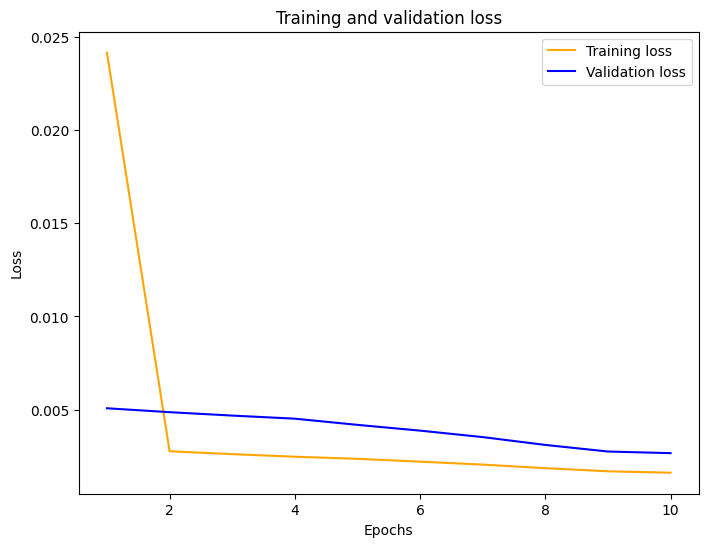

In [29]:
plot_curve(hist_batch_size64)

In [30]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.330756,0.318283,0.327207
1,2021-12-16 09:11:00,0.112,0.148943,0.120574,0.252725
2,2021-12-16 09:12:00,0.116,0.118632,0.110354,0.182554
3,2021-12-16 09:13:00,0.112,0.118886,0.114629,0.134944
4,2021-12-16 09:14:00,0.099,0.116727,0.110894,0.116558
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.171209,0.163314,0.173192
289,2021-12-16 13:59:00,0.169,0.170886,0.163241,0.172759
290,2021-12-16 14:00:00,0.147,0.171631,0.164158,0.172748
291,2021-12-16 14:01:00,0.145,0.154430,0.144105,0.165346


In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [32]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
lstm_rmse_error2 = mean_squared_error(test1["cloud_cover"], test1["LSTM_4_batch_size"], squared=False)
lstm_mae_error2 = mae(test1["cloud_cover"], test1["LSTM_4_batch_size"])
lstm_mape_error2 = mape(test1['cloud_cover'], test1['LSTM_4_batch_size'])
error(lstm_mse_error_batch_size64,lstm_rmse_error2,lstm_mae_error2,lstm_mape_error2)

[{'MSE': 0.002659469094520837,
  'RMSE': 0.05157004066821004,
  'MAE': 0.016937104030884165,
  'MAPE': 0.08286408546446998}]

In [33]:
compare_model(lstm_mape_error,lstm_mape_error2)

Better MSE value is :  0.057024183094116464


,Model,MSE error
0,model,0.057024
1,model_1,0.082864


In [117]:
data2 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error2, 'MAPE error' : lstm_mape_error2,'MSE error':lstm_mse_error_batch_size64
              , 'RMSE error':lstm_rmse_error2}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\3116887897.py:5: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570


---

### learning rate 0.1

In [35]:
test2 = test.copy()

#### Add frist layer: units = 50

In [36]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 6s 6ms/step - loss: 0.0476 - val_loss: 0.0027
Epoch 2/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 3/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0019
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0027
Epoch 5/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0027
Epoch 6/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0031
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 10/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0021

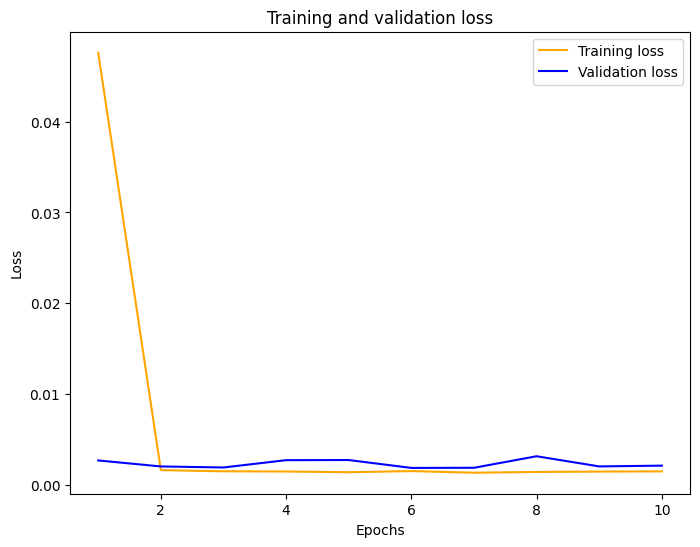

In [37]:
plot_curve(hist_01)

In [38]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-16 09:10:00,0.111,0.347333
1,2021-12-16 09:11:00,0.112,0.124951
2,2021-12-16 09:12:00,0.116,0.125724
3,2021-12-16 09:13:00,0.112,0.133641
4,2021-12-16 09:14:00,0.099,0.143069
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.183365
289,2021-12-16 13:59:00,0.169,0.183336
290,2021-12-16 14:00:00,0.147,0.184294
291,2021-12-16 14:01:00,0.145,0.162906


In [39]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [40]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
lstm_rmse_error3 = mean_squared_error(test2["cloud_cover"], test2["LSTM_01"], squared=False)
lstm_mae_error3 = mae(test2["cloud_cover"], test2["LSTM_01"])
lstm_mape_error3 = mape(test2['cloud_cover'], test2['LSTM_01'])
error(lstm_mse_error_unit_50_01,lstm_rmse_error3,lstm_mae_error3,lstm_mape_error3)

[{'MSE': 0.0020753136650037193,
  'RMSE': 0.04555561068632182,
  'MAE': 0.01917885432837359,
  'MAPE': 0.10688646090409404}]

In [41]:
compare_model(lstm_mape_error,lstm_mape_error3)

Better MSE value is :  0.057024183094116464


,Model,MSE error
0,model,0.057024
1,model_1,0.106886


In [118]:
data3 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error3, 'MAPE error' : lstm_mape_error3,'MSE error':lstm_mse_error_unit_50_01, 'RMSE error':lstm_rmse_error3}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\1270089500.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [43]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 6ms/step - loss: 0.0077 - val_loss: 0.0019
Epoch 2/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 3/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0025
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 6/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 7/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0016 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0020

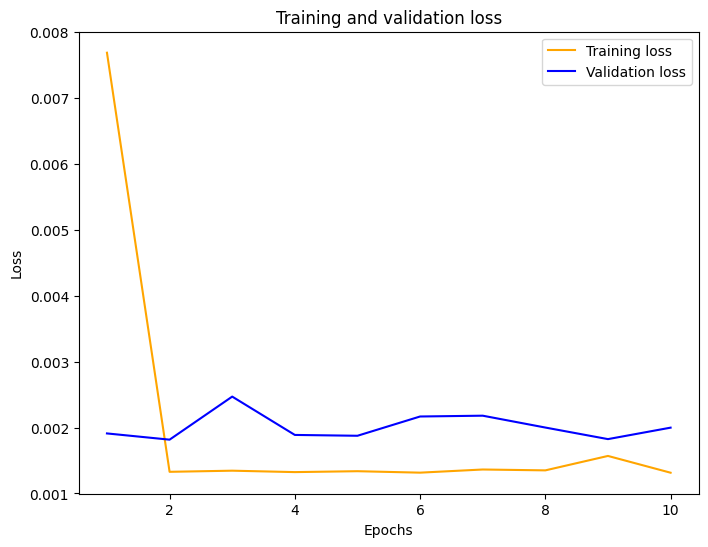

In [44]:
plot_curve(hist_005)

In [45]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.347333,0.315886
1,2021-12-16 09:11:00,0.112,0.124951,0.116287
2,2021-12-16 09:12:00,0.116,0.125724,0.089059
3,2021-12-16 09:13:00,0.112,0.133641,0.102580
4,2021-12-16 09:14:00,0.099,0.143069,0.105618
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.183365,0.153810
289,2021-12-16 13:59:00,0.169,0.183336,0.153592
290,2021-12-16 14:00:00,0.147,0.184294,0.154558
291,2021-12-16 14:01:00,0.145,0.162906,0.134588


In [46]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [47]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
lstm_rmse_error4 = mean_squared_error(test2["cloud_cover"], test2["LSTM_005"], squared=False)
lstm_mae_error4 = mae(test2["cloud_cover"], test2["LSTM_005"])
lstm_mape_error4 = mape(test2['cloud_cover'], test2['LSTM_005'])

error(lstm_mse_error_unit_50_005,lstm_rmse_error4,lstm_mae_error4,lstm_mape_error4)

[{'MSE': 0.001988308900785564,
  'RMSE': 0.044590457508143645,
  'MAE': 0.020574293837612403,
  'MAPE': 0.10479215178589006}]

In [48]:
compare_model(lstm_mape_error,lstm_mape_error4)

Better MSE value is :  0.057024183094116464


,Model,MSE error
0,model,0.057024
1,model_1,0.104792


In [119]:
data4 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error4, 'MAPE error' : lstm_mape_error4,'MSE error':lstm_mse_error_unit_50_005, 'RMSE error':lstm_rmse_error4}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\2815516824.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [50]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 6ms/step - loss: 0.0039 - val_loss: 0.0028
Epoch 2/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0020
Epoch 3/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 6/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018

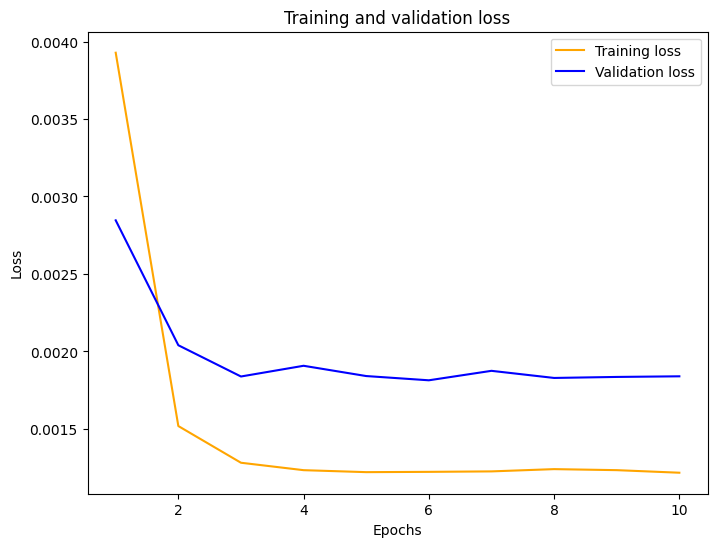

In [51]:
plot_curve(hist_001)

In [52]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-16 09:10:00,0.111,0.347333,0.315886,0.327984
1,2021-12-16 09:11:00,0.112,0.124951,0.116287,0.120606
2,2021-12-16 09:12:00,0.116,0.125724,0.089059,0.128690
3,2021-12-16 09:13:00,0.112,0.133641,0.102580,0.129678
4,2021-12-16 09:14:00,0.099,0.143069,0.105618,0.120897
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.183365,0.153810,0.173067
289,2021-12-16 13:59:00,0.169,0.183336,0.153592,0.173248
290,2021-12-16 14:00:00,0.147,0.184294,0.154558,0.174188
291,2021-12-16 14:01:00,0.145,0.162906,0.134588,0.152354


In [53]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [54]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
lstm_rmse_error5 = mean_squared_error(test2["cloud_cover"], test2["LSTM_001"], squared=False)
lstm_mae_error5 = mae(test2["cloud_cover"], test2["LSTM_001"])
lstm_mape_error5 = mape(test2['cloud_cover'], test2['LSTM_001'])
error(lstm_mse_error_001,lstm_rmse_error5,lstm_mae_error5,lstm_mape_error5)

[{'MSE': 0.0018302788741636792,
  'RMSE': 0.042781758661416425,
  'MAE': 0.01233794019063585,
  'MAPE': 0.062135015487852344}]

In [55]:
compare_model(lstm_mape_error,lstm_mape_error5)

Better MSE value is :  0.057024183094116464


,Model,MSE error
0,model,0.057024
1,model_1,0.062135


In [120]:
data5 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error5, 'MAPE error' : lstm_mape_error5,'MSE error':lstm_mse_error_001, 'RMSE error':lstm_rmse_error5}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\158870608.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.01,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [57]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 11s 11ms/step - loss: 0.0043 - val_loss: 0.0032
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 5/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 6/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 7/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 10/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.00

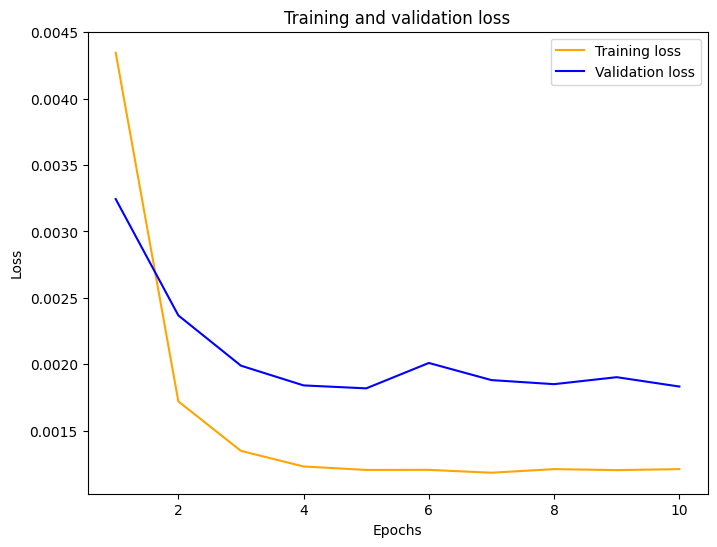

In [58]:
plot_curve(hist_0005)

In [59]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 2ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-16 09:10:00,0.111,0.347333,0.315886,0.327984,0.327636
1,2021-12-16 09:11:00,0.112,0.124951,0.116287,0.120606,0.127410
2,2021-12-16 09:12:00,0.116,0.125724,0.089059,0.128690,0.110797
3,2021-12-16 09:13:00,0.112,0.133641,0.102580,0.129678,0.116376
4,2021-12-16 09:14:00,0.099,0.143069,0.105618,0.120897,0.113158
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.183365,0.153810,0.173067,0.167624
289,2021-12-16 13:59:00,0.169,0.183336,0.153592,0.173248,0.167501
290,2021-12-16 14:00:00,0.147,0.184294,0.154558,0.174188,0.168437
291,2021-12-16 14:01:00,0.145,0.162906,0.134588,0.152354,0.148049


In [60]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [61]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
lstm_rmse_error6 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0005"], squared=False)
lstm_mae_error6 = mae(test2["cloud_cover"], test2["LSTM_0005"])
lstm_mape_error6 = mape(test2['cloud_cover'], test2['LSTM_0005'])
error(lstm_mse_error_unit_50_0005,lstm_rmse_error6,lstm_mae_error6,lstm_mape_error6)

[{'MSE': 0.0018228232794686816,
  'RMSE': 0.0426945345386114,
  'MAE': 0.010836192351966183,
  'MAPE': 0.05108431708420606}]

In [62]:
compare_model(lstm_mape_error,lstm_mape_error6)

Better MSE value is :  0.05108431708420606


,Model,MSE error
0,model,0.057024
1,model_1,0.051084


In [121]:
data5 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error6, 'MAPE error' : lstm_mape_error6,'MSE error':lstm_mse_error_unit_50_0005, 'RMSE error':lstm_rmse_error6}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\496555878.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.01,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
6,5,Adam,32,0.005,50,,,,,1,10,0.010836,0.051084,0.001823,0.042695


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [64]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 9s 11ms/step - loss: 0.0114 - val_loss: 0.0047
Epoch 2/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0025 - val_loss: 0.0044
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0023 - val_loss: 0.0038
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0020 - val_loss: 0.0032
Epoch 5/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0017 - val_loss: 0.0028
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 10/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - val_loss: 0.002

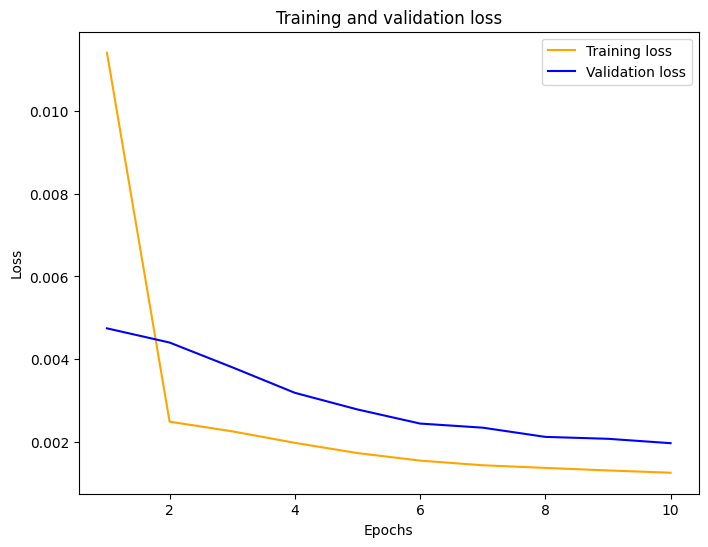

In [65]:
plot_curve(hist_0001)

In [66]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.347333,0.315886,0.327984,0.327636,0.327984
1,2021-12-16 09:11:00,0.112,0.124951,0.116287,0.120606,0.127410,0.120606
2,2021-12-16 09:12:00,0.116,0.125724,0.089059,0.128690,0.110797,0.128690
3,2021-12-16 09:13:00,0.112,0.133641,0.102580,0.129678,0.116376,0.129678
4,2021-12-16 09:14:00,0.099,0.143069,0.105618,0.120897,0.113158,0.120897
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.183365,0.153810,0.173067,0.167624,0.173067
289,2021-12-16 13:59:00,0.169,0.183336,0.153592,0.173248,0.167501,0.173248
290,2021-12-16 14:00:00,0.147,0.184294,0.154558,0.174188,0.168437,0.174188
291,2021-12-16 14:01:00,0.145,0.162906,0.134588,0.152354,0.148049,0.152354


In [67]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [68]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
lstm_rmse_error7 = mean_squared_error(test2["cloud_cover"], test2["LSTM_0001"], squared=False)
lstm_mae_error7 = mae(test2["cloud_cover"], test2["LSTM_0001"])
lstm_mape_error7 = mape(test2['cloud_cover'], test2['LSTM_0001'])
error(lstm_mse_error_0001,lstm_rmse_error7,lstm_mae_error7,lstm_mape_error7)


[{'MSE': 0.0018302788741636792,
  'RMSE': 0.042781758661416425,
  'MAE': 0.01233794019063585,
  'MAPE': 0.062135015487852344}]

In [69]:
compare_model(lstm_mape_error6,lstm_mape_error7)

Better MSE value is :  0.05108431708420606


,Model,MSE error
0,model,0.051084
1,model_1,0.062135


In [122]:
data6 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error7, 'MAPE error' : lstm_mape_error7,'MSE error':lstm_mse_error_0001, 'RMSE error':lstm_rmse_error7}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\2605599843.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.01,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
6,5,Adam,32,0.005,50,,,,,1,10,0.010836,0.051084,0.001823,0.042695
7,5,Adam,32,0.001,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [107]:
test3 = test.copy()

In [108]:
test3['LSTM_50'] = predict_0005

In [109]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 12s 14ms/step - loss: 0.0045 - val_loss: 0.0032
Epoch 2/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 3/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0014 - val_loss: 0.0019
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 5/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 6/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - val_loss: 0.0019
Epoch 8/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0012 - val_loss: 0.00

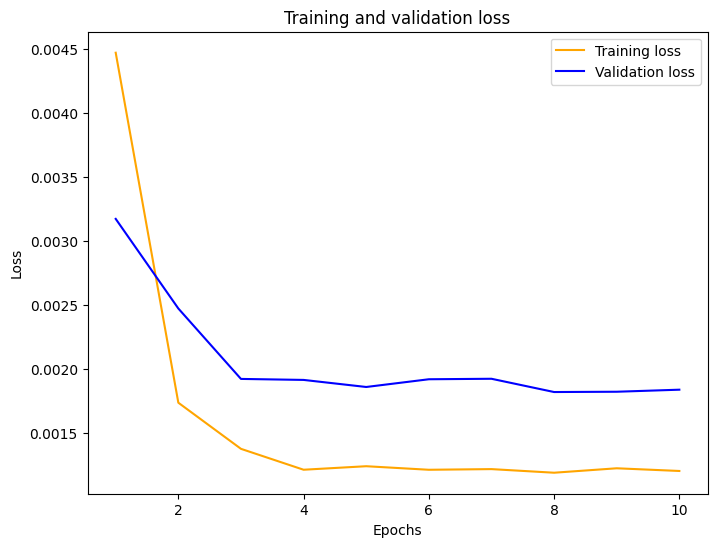

In [110]:
plot_curve(hist_1)

In [111]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.327636,0.328197
1,2021-12-16 09:11:00,0.112,0.127410,0.123339
2,2021-12-16 09:12:00,0.116,0.110797,0.094195
3,2021-12-16 09:13:00,0.112,0.116376,0.112997
4,2021-12-16 09:14:00,0.099,0.113158,0.112999
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167624,0.165718
289,2021-12-16 13:59:00,0.169,0.167501,0.165434
290,2021-12-16 14:00:00,0.147,0.168437,0.166475
291,2021-12-16 14:01:00,0.145,0.148049,0.146036


In [112]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [113]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
lstm_rmse_error8 = mean_squared_error(test3["cloud_cover"], test3["LSTM_100"], squared=False)
lstm_mae_error8 = mae(test3["cloud_cover"], test3["LSTM_100"])
lstm_mape_error8 = mape(test3['cloud_cover'], test3['LSTM_100'])
# error(lstm_mse_error_unit_100,lstm_rmse_error8,lstm_mae_error8,lstm_mape_error8)

In [114]:
compare_model(lstm_mape_error6,lstm_mape_error8)

Better MSE value is :  0.05108431708420606


,Model,MSE error
0,model,0.051084
1,model_1,0.055110


In [123]:
data7 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 100, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error8, 'MAPE error' : lstm_mape_error8,'MSE error':lstm_mse_error_unit_100, 'RMSE error':lstm_rmse_error8}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\1092600840.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.01,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
6,5,Adam,32,0.005,50,,,,,1,10,0.010836,0.051084,0.001823,0.042695
7,5,Adam,32,0.001,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
8,5,Adam,32,0.005,100,,,,,1,10,0.011804,0.055110,0.001828,0.042750


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [124]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 9s 10ms/step - loss: 0.0064 - val_loss: 0.0036
Epoch 2/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0026 - val_loss: 0.0028
Epoch 3/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 4/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 5/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0017 - val_loss: 0.0020
Epoch 6/10
462/462 [==============================] - 3s 5ms/step - loss: 0.0017 - val_loss: 0.0019
Epoch 7/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0016 - val_loss: 0.0019
Epoch 8/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0018
Epoch 9/10
462/462 [==============================] - 2s 5ms/step - loss: 0.0015 - val_loss: 0.0018
Epoch 10/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0015 - val_loss: 0.001

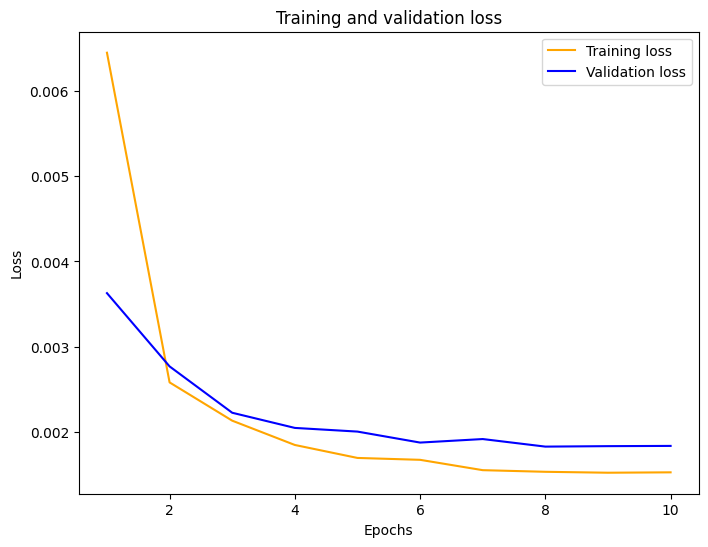

In [125]:
plot_curve(hist_2)

In [126]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.327636,0.328197,0.331045
1,2021-12-16 09:11:00,0.112,0.127410,0.123339,0.127589
2,2021-12-16 09:12:00,0.116,0.110797,0.094195,0.109251
3,2021-12-16 09:13:00,0.112,0.116376,0.112997,0.115569
4,2021-12-16 09:14:00,0.099,0.113158,0.112999,0.114322
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167624,0.165718,0.172485
289,2021-12-16 13:59:00,0.169,0.167501,0.165434,0.172319
290,2021-12-16 14:00:00,0.147,0.168437,0.166475,0.173280
291,2021-12-16 14:01:00,0.145,0.148049,0.146036,0.152489


In [127]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [128]:
lstm_mse_error_100_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
lstm_rmse_error9 = mean_squared_error(test3["cloud_cover"], test3["LSTM_Drop_out"], squared=False)
lstm_mae_error9 = mae(test3["cloud_cover"], test3["LSTM_Drop_out"])
lstm_mape_error9 = mape(test3['cloud_cover'], test3['LSTM_Drop_out'])
# error(lstm_mse_error_100_drop_out,lstm_rmse_error9,lstm_mae_error9,lstm_mape_error9)

In [129]:
compare_model(lstm_mape_error6,lstm_mape_error9)

Better MSE value is :  0.05108431708420606


,Model,MSE error
0,model,0.051084
1,model_1,0.058326


In [130]:
data8 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':0.1, 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error9, 'MAPE error' : lstm_mape_error9,'MSE error':lstm_mse_error_100_drop_out, 'RMSE error':lstm_rmse_error9}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\682891538.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.01,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
6,5,Adam,32,0.005,50,,,,,1,10,0.010836,0.051084,0.001823,0.042695
7,5,Adam,32,0.001,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
8,5,Adam,32,0.005,100,,,,,1,10,0.011804,0.055110,0.001828,0.042750
9,5,Adam,32,0.005,50,0.1,,,,1,10,0.011749,0.058326,0.001831,0.042784


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [131]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 14s 12ms/step - loss: 0.0053 - val_loss: 0.0039
Epoch 2/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0017 - val_loss: 0.0020
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 4/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 5/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 6/10
462/462 [==============================] - 3s 8ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 7/10
462/462 [==============================] - 3s 8ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 8/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 9/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 10/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0013 - val_loss: 0.00

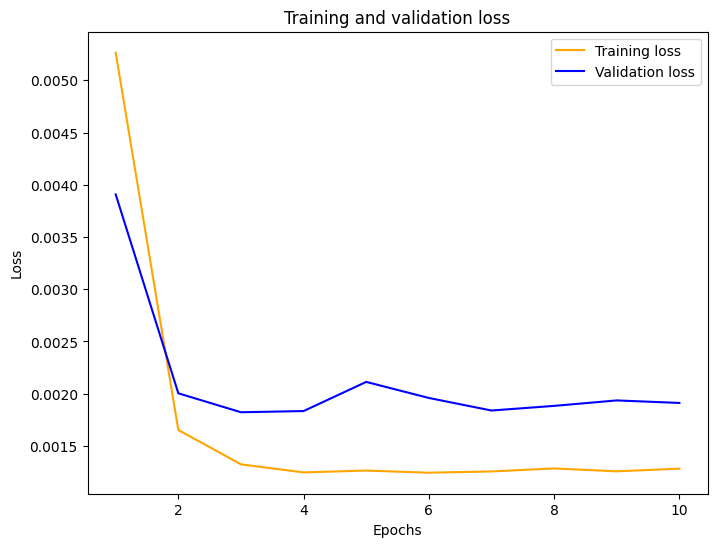

In [132]:
plot_curve(hist_3)

In [133]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.327636,0.328197,0.331045,0.336442
1,2021-12-16 09:11:00,0.112,0.127410,0.123339,0.127589,0.125370
2,2021-12-16 09:12:00,0.116,0.110797,0.094195,0.109251,0.114218
3,2021-12-16 09:13:00,0.112,0.116376,0.112997,0.115569,0.125637
4,2021-12-16 09:14:00,0.099,0.113158,0.112999,0.114322,0.121992
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167624,0.165718,0.172485,0.175826
289,2021-12-16 13:59:00,0.169,0.167501,0.165434,0.172319,0.175803
290,2021-12-16 14:00:00,0.147,0.168437,0.166475,0.173280,0.176830
291,2021-12-16 14:01:00,0.145,0.148049,0.146036,0.152489,0.154896


In [134]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [135]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
lstm_rmse_error11 = mean_squared_error(test3["cloud_cover"], test3["LSTM_second_layer_50"], squared=False)
lstm_mae_error11 = mae(test3["cloud_cover"], test3["LSTM_second_layer_50"])
lstm_mape_error11 = mape(test3['cloud_cover'], test3['LSTM_second_layer_50'])
# error(lstm_mse_error_second_layer,lstm_rmse_error11,lstm_mae_error11,lstm_mape_error11)


In [136]:
compare_model(lstm_mape_error6,lstm_mape_error11)

Better MSE value is :  0.05108431708420606


,Model,MSE error
0,model,0.051084
1,model_1,0.071594


In [137]:
data10 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':50, 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':10 , 'MAE error':lstm_mae_error11, 'MAPE error' : lstm_mape_error11,'MSE error':lstm_mse_error_second_layer, 'RMSE error':lstm_rmse_error11}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\3566125220.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.01,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
6,5,Adam,32,0.005,50,,,,,1,10,0.010836,0.051084,0.001823,0.042695
7,5,Adam,32,0.001,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
8,5,Adam,32,0.005,100,,,,,1,10,0.011804,0.055110,0.001828,0.042750
9,5,Adam,32,0.005,50,0.1,,,,1,10,0.011749,0.058326,0.001831,0.042784


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [138]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
462/462 [==============================] - 8s 8ms/step - loss: 0.0055 - val_loss: 0.0034
Epoch 2/20
462/462 [==============================] - 3s 7ms/step - loss: 0.0017 - val_loss: 0.0024
Epoch 3/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 4/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0013 - val_loss: 0.0019
Epoch 5/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 6/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 7/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 8/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 9/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018
Epoch 10/20
462/462 [==============================] - 2s 5ms/step - loss: 0.0012 - val_loss: 0.0018

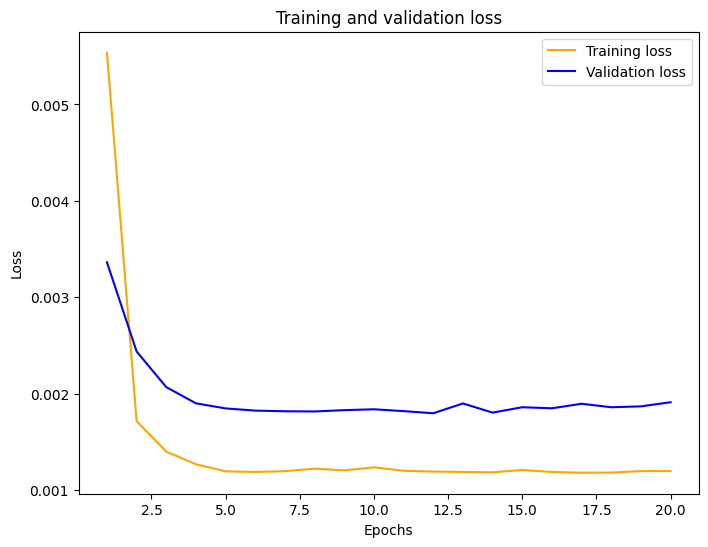

In [139]:
plot_curve(hist_5)

In [140]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-16 09:10:00,0.111,0.327636,0.328197,0.331045,0.336442,0.319250
1,2021-12-16 09:11:00,0.112,0.127410,0.123339,0.127589,0.125370,0.118989
2,2021-12-16 09:12:00,0.116,0.110797,0.094195,0.109251,0.114218,0.101879
3,2021-12-16 09:13:00,0.112,0.116376,0.112997,0.115569,0.125637,0.108676
4,2021-12-16 09:14:00,0.099,0.113158,0.112999,0.114322,0.121992,0.105465
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167624,0.165718,0.172485,0.175826,0.159244
289,2021-12-16 13:59:00,0.169,0.167501,0.165434,0.172319,0.175803,0.159128
290,2021-12-16 14:00:00,0.147,0.168437,0.166475,0.173280,0.176830,0.160078
291,2021-12-16 14:01:00,0.145,0.148049,0.146036,0.152489,0.154896,0.139606


In [141]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [142]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
lstm_rmse_error12 = mean_squared_error(test3["cloud_cover"], test3["LSTM_epoch20"], squared=False)
lstm_mae_error12 = mae(test3["cloud_cover"], test3["LSTM_epoch20"])
lstm_mape_error12 = mape(test3['cloud_cover'], test3['LSTM_epoch20'])
# error(lstm_mse_error_unit_50_epoch20,lstm_rmse_error12,lstm_mae_error12,lstm_mape_error12)

In [143]:
compare_model(lstm_mape_error6,lstm_mape_error12)

Better MSE value is :  0.05108431708420606


,Model,MSE error
0,model,0.051084
1,model_1,0.077961


In [144]:
data11 = [{'Lags':5 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'Frist layer': 50, 'Drop out':'', 'Second layer':'', 'Drop out2':'',
              'Third layer':'','Output layer':1, 'Epochs':20 , 'MAE error':lstm_mae_error12, 'MAPE error' : lstm_mape_error12,'MSE error':lstm_mse_error_unit_50_epoch20, 'RMSE error':lstm_rmse_error12}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_2320\773785952.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,,50,,,,,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,,50,,,,,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,,50,,,,,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.1,50,,,,,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.05,50,,,,,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.01,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
6,5,Adam,32,0.005,50,,,,,1,10,0.010836,0.051084,0.001823,0.042695
7,5,Adam,32,0.001,50,,,,,1,10,0.012338,0.062135,0.001830,0.042782
8,5,Adam,32,0.005,100,,,,,1,10,0.011804,0.055110,0.001828,0.042750
9,5,Adam,32,0.005,50,0.1,,,,1,10,0.011749,0.058326,0.001831,0.042784


---

# save model

In [145]:
mse_data = mse_data.round({"MSE error": 6, "MAE error": 6, "MAPE error": 6, "RMSE error": 6})

In [146]:
mse_data.to_csv('data_last_day_lag5.csv',index=False)

In [147]:
lstm = pd.read_csv('data_last_day_lag5.csv')

In [148]:
lstm

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.011943,0.057024,0.001834,0.042828
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.014134,0.061505,0.001822,0.042686
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.016937,0.082864,0.002659,0.051570
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.019179,0.106886,0.002075,0.045556
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.020574,0.104792,0.001988,0.044590
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.012338,0.062135,0.001830,0.042782
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.010836,0.051084,0.001823,0.042695
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.012338,0.062135,0.001830,0.042782
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.011804,0.055110,0.001828,0.042750
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.011749,0.058326,0.001831,0.042784


# error

In [149]:
error = lstm.groupby(['Lags'])[['MAE error','MAPE error','MSE error','RMSE error']].transform(min) == lstm[['MAE error','MAPE error','MSE error','RMSE error']]
lstm[error]

,Lags,Optimizer,Batch_size,Learning rate,Frist layer,Drop out,Second layer,Drop out2,Third layer,Output layer,Epochs,MAE error,MAPE error,MSE error,RMSE error
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001822,0.042686
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.010836,0.051084,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [150]:
model_0005.save('model_last_day_lag5.h5')